# Homework 3: Computer Vision

**Overview**: In HW3 you will get familiarized with many techniques in the intersection of Computer Vision & Deep Learning. Specifically, you will be building a convolutional neural network (CNN) for classification, use transfer learning to boost your classifier's accuracy, and build two generative models, a GAN (Generative Adversarial Network) and a VAE (Variational AutoEncoder). This notebook is the first portion of the homework, the GAN portion of the homework will be released soon. 

**Note:** This homework was noted by many students last year to be the hardest homework of the semester, so we highly recommend starting immediately on this homework. Also, to make this homework more manageable, we will allow you to work in groups of (2). Note that only **one** member of your group should submit the homework.

**Online Policy:** You may look up guides online that give you general advice / explanations on VAE's / GAN's and may look for instance at the PyTorch documentation but **may not** copy code from anywhere online. We will be transparent that there exists GAN and VAE solutions online (with their respective hyperparameters), however, copying any such code is **strictly prohibited**. We have spent many hours constructing this homework so that you do not have to utilize such resources and as such will be strict in enforcing this policy. Any violations may be escalated to the Office of Student Conduct (OSC). 

**Collaboration Policy:** This homework assignment is meant to be done in **groups of 2**. You may work on this individually, but be warned that this homework assignment is extremely long and will be very difficult to do alone. We highly recommend you form groups. Since this is a group assignment, please read over the collaboration policy again, posted [here](https://www.seas.upenn.edu/~cis522/syllabus.html).

This homework (**including the GAN portion**) will be due on **March 5, 2020**.



## Q0. Setting up (0 pts)

### Connect to Google Drive

Run the following to get the create a connected directory in Google drive to store data and models

In [0]:
import os
from google.colab import drive
drive.mount('/content/drive')

DATASETS_PATH = '/content/drive/My Drive/Colab Notebooks/hw3/datasets.7z' # Please replace with the path to your "datasets.7z" file.
ESCAPED_PATH = DATASETS_PATH.replace(" ", "\\ ") # This replaces any spaces in your path with "\ "

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
# import glob

In [0]:
# for name in glob.glob('/content/DATASETS/Caltech/train/*'):
#   print(name)

Run the command below to extract the datasets

In [0]:
!7z x {ESCAPED_PATH} # Here we decompress / extract the dataset


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,4 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/My Drive/Colab Notebooks/hw3/                                                      1 file, 655252737 bytes (625 MiB)

Extracting archive: /content/drive/My Drive/Colab Notebooks/hw3/datasets.7z
--
Path = /content/drive/My Drive/Colab Notebooks/hw3/datasets.7z
Type = 7z
Physical Size = 655252737
Headers Size = 530102
Method = LZMA2:24
Solid = +
Blocks = 1

  0%      0% 438 - DATASETS/Caltech/train/003.Soo . y_Albatross_0003_108955162.jpg                                                                          

### Test Infrastructure

Run the two code snippets below to instantiate our infrastructure for this assignment.

In [0]:
import os
import dill

repo_path = "/content/Homework3_Resources/"

if not os.path.isdir(repo_path):
  !git clone https://github.com/CIS522/Homework3_Resources.git

test_set_zip_path = "/content/Homework3_Resources/test.zip"
unzipped_test_folder = "/content/content/test"
final_test_dest = "/content/caltech_test"

!unzip {test_set_zip_path}
!mv {unzipped_test_folder} {final_test_dest}

def generate_caltech_ucsd_birds_predictions(generate_predictions_func):
  return generate_predictions_func(final_test_dest)

Cloning into 'Homework3_Resources'...
remote: Enumerating objects: 6, done.
remote: Total 6 (delta 0), reused 0 (delta 0), pack-reused 6
Unpacking objects: 100% (6/6), done.
Archive:  /content/Homework3_Resources/test.zip
   creating: content/test/
  inflating: content/test/0172.jpg   
  inflating: content/test/0233.jpg   
  inflating: content/test/0395.jpg   
  inflating: content/test/0611.jpg   
  inflating: content/test/0801.jpg   
  inflating: content/test/0832.jpg   
  inflating: content/test/0457.jpg   
  inflating: content/test/0362.jpg   
  inflating: content/test/0603.jpg   
  inflating: content/test/0073.jpg   
  inflating: content/test/0281.jpg   
  inflating: content/test/0843.jpg   
  inflating: content/test/0974.jpg   
  inflating: content/test/0411.jpg   
  inflating: content/test/0591.jpg   
  inflating: content/test/1121.jpg   
  inflating: content/test/1200.jpg   
  inflating: content/test/0471.jpg   
  inflating: content/test/0575.jpg   
  inflating: content/test/020

In [0]:
test_case_1b = None
test_case_1c = None
test_case_1d = None
test_case_2a = None

## Question 1. Build a Classifier for the Caltech-UCSD Birds 200 Dataset (15 pts)

In this question you will be working with the Caltech-UCSD Birds 200 dataset (linked [here](http://www.vision.caltech.edu/visipedia/CUB-200.html)) where you will build your own Dataset / Dataloader / classifier for the dataset. As with previous assignments, please only use the version of the dataset that we provide to you, **do not** download the dataset from another source.


**Understanding / Using the Data**

**Q1a (2 pts):** Create a Dataset / Dataloader from the training set and visualize 5 pictures. Put those images in the writeup. Do the same with the provided validation set. Note that for this homework, because of the limited data available, do not worry about creating a test set.

In [0]:
!pip install --upgrade grpcio
!pip install --upgrade tensorflow

     |████████████████████████████████| 2.7MB 5.1MB/s 
  Found existing installation: grpcio 1.27.1
    Uninstalling grpcio-1.27.1:
      Successfully uninstalled grpcio-1.27.1


     |████████████████████████████████| 421.8MB 40kB/s 
     |████████████████████████████████| 450kB 43.7MB/s 
     |████████████████████████████████| 3.9MB 32.8MB/s 
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0
  Found existing installation: tensorflow 1.15.0
    Uninstalling tensorflow-1.15.0:
      Successfully uninstalled tensorflow-1.15.0


In [0]:
import torchvision
from torchvision import transforms
import torch

import torch
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
import numpy as np

from tensorflow import summary
import datetime
# TODO: INSERT CODE HERE
class LogisticRegression(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LogisticRegression, self).__init__()
        self.l1 = torch.nn.Linear(input_dim,output_dim)
        pass

    def forward(self, x):
      out = self.l1(x)
      return out

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [0]:
# TODO: INSERT CODE HERE
train_folder = torchvision.datasets.ImageFolder(root = '/content/DATASETS/Caltech/train', transform = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()]))
train_loader = torch.utils.data.DataLoader(train_folder,batch_size=16,shuffle=True)
val_folder = torchvision.datasets.ImageFolder(root = '/content/DATASETS/Caltech/val', transform = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()]))
val_loader = train = torch.utils.data.DataLoader(val_folder,batch_size=16,shuffle=True)

In [0]:
def q1_image():
  '''
  Displays the images in a rows * cols grid
  '''
  figure = plt.figure()
  for i, data in enumerate(train_loader):
    for j in range(5):
      plt.subplot(2, 5, j + 1)
      plt.imshow(data[0][j].permute(1, 2, 0))
      # plt.title(data[1][j])
      # plt.subplot(2, 5, j + 6)
      # plt.imshow(reconstruction[j].permute(1, 2, 0))
    if(i == 0):
      break
  # figure.tight_layout()

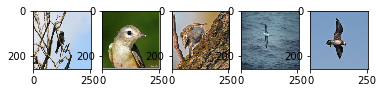

In [0]:
 q1_image()

In [0]:
current_time = str(datetime.datetime.now().timestamp())
train_log_dir = 'logs/tensorboard/train/'  + current_time
writer = summary.create_file_writer(train_log_dir)

**Logistic Regression Classification**

**Q1b (2 pts):** Use PyTorch to create a Logistic Regression model to classify the Bird Datset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
def test_model(test_dataloader, net):
  # TODO: Insert your code here
  test_correct = 0
  test_total = torch.tensor(0)
  num_instances = 0
  size = len(test_dataloader)
  total_loss = 0

  with torch.no_grad():
    
      for data in test_dataloader:
        labels, features = data[1].to(device), data[0].to(device)
        features = features.float()
        # features = features.view(-1,256*256*3)

        #perform prediction
        outputs = net(features)
        #this will give us two values (list of the confidence score, list of predicted labels) with size of the batch size
        pred_label = torch.max(outputs.data,1).indices
        loss = criterion(outputs, labels)

        test_total += labels.shape[0] #16 because of the batch size

        test_correct += torch.sum(torch.where(pred_label == labels, torch.ones_like(labels), torch.zeros_like(labels)))
        num_instances += size

        total_loss += loss.item()
  
  #calculate the accuracy
  accuracy = test_correct.cpu().detach().numpy().item()/test_total.detach().numpy().item()
  return accuracy

In [0]:
# TODO: INSERT CODE HERE
class LogisticRegression(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LogisticRegression, self).__init__()
        self.l1 = torch.nn.Linear(input_dim,output_dim)
        pass

    def forward(self, x):
      out = self.l1(x)
      return out

In [0]:
logreg = LogisticRegression(256*256*3,195).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(logreg.parameters(), lr=0.0001)

overall_step = 0

for epoch in range(10):  # loop over the dataset multiple times

    # running_corrects = 0.0
    num_correct = 0.0
    len_of_data = 0

    running_loss = 0.0
    for i, data in enumerate(train_loader):
        
        labels, features = data[1].to(device), data[0].to(device)
        features = features.float()
        len_of_data += labels.shape[0]
        features = features.view(-1,256*256*3)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = logreg(features)
        pred_label = torch.max(outputs.data,1).indices
        # updated_pred = pred_label.add(1)
        num_correct += torch.sum(torch.where(pred_label == labels, torch.ones_like(labels), torch.zeros_like(labels)))

        loss = criterion(outputs, labels) #for cross entropy loss, we want to calculate the loss between the confidence score and the true label
        loss.backward()
        optimizer.step()
        overall_step+=1

        running_loss += loss.item()

    accuracy_per_epoch = num_correct / len_of_data
    print(accuracy_per_epoch)
    with writer.as_default():
        summary.scalar('logreg loss', running_loss, step=overall_step+1)

    with writer.as_default():
        summary.scalar('logreg training accuracy', accuracy_per_epoch.cpu().data.numpy(), step=overall_step+1)

In [0]:
test_model(val_loader, logreg)

In [0]:
%load_ext tensorboard

In [0]:
%tensorboard --logdir logs/tensorboard

**Feed Forward Neural Network Classification**

**Q1c (3 pts):** Create a Feed Forward neural network to classify the Bird Dataset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
# TODO: INSERT CODE HERE
# TODO: INSERT CODE HERE
class MLP(nn.Module):
  def __init__(self):
    super(MLP, self).__init__()
    # Write your code here
    self.l0 = torch.nn.Linear(256*256*3, 1024)
    self.l1 = torch.nn.Linear(1024,784)
    self.l2 = torch.nn.Linear(784,256)
    self.l3 = torch.nn.Linear(256,195)
    self.relu = torch.nn.ReLU()

    pass

  def forward(self, x):
    # Write your code here
    out = self.relu(self.l0(x))
    out = self.relu(self.l1(out))
    out = self.relu(self.l2(out))
    out = self.l3(out)

    return out

In [0]:
mlp = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(mlp.parameters(), lr=0.001)

overall_step = 0

for epoch in range(30):  # loop over the dataset multiple times

    # running_corrects = 0.0
    num_correct = 0.0
    len_of_data = 0
    torch.cuda.empty_cache()
    running_loss = 0.0
    for i, data in enumerate(train_loader):
        
        labels, features = data[1].to(device), data[0].to(device)
        features = features.float()
        len_of_data += labels.shape[0]
        features = features.view(-1,256*256*3)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = mlp(features)
        
        pred_label = torch.max(outputs.data,1).indices
        # updated_pred = pred_label.add(1)
        num_correct += torch.sum(torch.where(pred_label == labels, torch.ones_like(labels), torch.zeros_like(labels)))

        loss = criterion(outputs, labels) #for cross entropy loss, we want to calculate the loss between the confidence score and the true label
        loss.backward()
        optimizer.step()

        overall_step+=1

        running_loss += loss.item()

    accuracy_per_epoch = num_correct / len_of_data
    print(accuracy_per_epoch)
    with writer.as_default():
        summary.scalar('mlp loss', running_loss, step=overall_step+1)

    with writer.as_default():
        summary.scalar('mlp training accuracy', accuracy_per_epoch.cpu().data.numpy(), step=overall_step+1)



In [0]:
%tensorboard --logdir logs/tensorboard

**CNN Classification**

**Q1d (6 pts):** Create a CNN to classify the Bird Dataset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
import torch.nn.functional as F

In [0]:
# TODO: INSERT CODE HERE
class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(3, 6, 3) #output = 256 - 3 + 1 = 254(h) * 254(w) * 6(filters)
    self.pool = nn.MaxPool2d(2) #output = 254/2 = 127(h) * 127(w) * 6(filters)
    self.conv2 = nn.Conv2d(6, 16 , 3) #output = 127 - 3 + 1 = 125/2 (maxpooling) = floor(62.5) = 62 *62 *16 -> size of input fc
    self.fc1 = nn.Linear(62*62*16, 576) 
    self.fc2 = nn.Linear(576, 256)
    self.fc3 = nn.Linear(256, 195)

    self.dropout = nn.Dropout2d()

  def forward(self, x):
    x = self.pool(F.relu(self.conv1(x)))
    
    x = self.pool(F.relu(self.dropout(self.conv2(x))))
    # print(x.shape)
    x = x.view(-1, 62*62*16) # -1 here is equivalent to 16 (for the batch size) - 62*62*3 (62 is the output from convolution + maxpooling of size 2)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)
    return x

In [0]:
cnn= CNN()
cnn.to(device)
optimizer = optim.Adam(cnn.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()

In [0]:
overall_step = 0
for epoch in range(30):  # loop over the dataset multiple times

    # running_corrects = 0.0
    num_correct = 0.0
    len_of_data = 0
    # torch.cuda.empty_cache()
    running_loss = 0.0
    for i, data in enumerate(train_loader):
        
        labels, features = data[1].to(device), data[0].to(device)
        features = features.float()
        len_of_data += labels.shape[0]
        # print(features.shape)
        # features = features.view(-1,256*256*3)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = cnn(features)
        
        pred_label = torch.max(outputs.data,1).indices
        # updated_pred = pred_label.add(1)
        num_correct += torch.sum(torch.where(pred_label == labels, torch.ones_like(labels), torch.zeros_like(labels)))

        loss = criterion(outputs, labels) #for cross entropy loss, we want to calculate the loss between the confidence score and the true label
        loss.backward()
        optimizer.step()

        overall_step+=1

        running_loss += loss.item()

    accuracy_per_epoch = num_correct / len_of_data
    with writer.as_default():
        summary.scalar('cnn loss', running_loss, step=overall_step+1)

    with writer.as_default():
        summary.scalar('cnn training accuracy', accuracy_per_epoch.cpu().data.numpy(), step=overall_step+1)
    print(accuracy_per_epoch)

**Comparing Results**

**Q1e(2 pts):** Which model performed the best? Compare the results of your different models in your writeup.

**Submitting your solutions**
Like the previous homework assignments, complete the following headers that return a Numpy array with predictions (i.e. a 0-195 label for which class each sample belongs to). Read the **Inputs:** and **Outputs:** sections carefully.

In [0]:
# class TestDataset(Dataset):
#     def __init__(self, path, transform=None):
#         self.image_paths = path
#         self.transform = transform

#     def __getitem__(self, index):
#         x = Image.open(self.image_paths[index])
#         x = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()])
#         if self.transform is not None:
#             x = self.transform(x)

#         return x

#     def __len__(self):
#         return len(self.image_paths)

In [0]:
# Inputs: The input to this function is the absolute path to the root folder of a directory of image
# from the caltech birds dataset.

# Output: Return a **numpy** array with a label from 0-195 for each of the individual images.
# Please remember to not shuffle your images so you can generate the correct predictions. The
# class label (0-195) comes from the folder name in your training dataset. For instance, any image
# from the folder named "007.Parakeet_Auklet" has a ground truth class label of "7". Your output
# should look something like: [0, 73, 165, 190, 12, ... , 93]

# Note that you have to implement three of these, one for each of the three different classifiers.

def generate_pytorch_caltech_birds_outputs(input):
  # TODO: Write your code here
  return None

def generate_feedforward_caltech_birds_outputs(input):
  # TODO: Write your code here
  return None

def generate_CNN_caltech_birds_outputs(input):
  # TODO: Write your code here
  return None

In [0]:
test_case_1b = generate_caltech_ucsd_birds_predictions(generate_pytorch_caltech_birds_outputs)
test_case_1c = generate_caltech_ucsd_birds_predictions(generate_feedforward_caltech_birds_outputs)
test_case_1d = generate_caltech_ucsd_birds_predictions(generate_CNN_caltech_birds_outputs)

## Question 2. Transfer Learning on ResNets for Image Classification (15 pts)

In this question we will explore different ways to bootstrap your image classifier when training examples are scarce. For the bird dataset, we have around 15 training images for each class, and variation between each class is limited (all birds). Due to the limited number of training examples, building a high-performing image classifier is challenging. 

ImageNet is one of the most popular computer vision data sets. It  contains 10 million images in total from multiple different categories. PyTorch provides ResNets that are pre-trained on ImageNet, and using this pretrained model, we can build a bird classifier much more easily. 

**Q2 (15 pts):** In the code snippet below, load a pre-trained ResNet model and swap out the last fully connected layer from the network with your own classification layer. Train the network, plot your training accuracy, and report your final validation accuracy. 
 A few tips:

* After the last fully connected layer of the network, remember to freeze the network except for the last layer to speed up the training.

* Pretrained ResNet models assumes that input is normalized in the following fashion, and is of the size at least 224.

In [0]:
from torchvision import datasets, transforms
import torchvision.models as models

In [0]:
input_size = 256
input_transforms = transforms.Compose([
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor()])

resnet = models.resnet50(pretrained=True)
print(resnet)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1,

In [0]:
def set_parameter_requires_grad(model, feature_extracting):
  if feature_extracting:
    for param in model.parameters():
      param.requires_grad = False

set_parameter_requires_grad(resnet, feature_extracting = True)

In [0]:
num_classes = 195
last_input = resnet.fc.in_features
resnet.fc = nn.Linear(last_input, num_classes)

In [0]:
pretrained_model = resnet.to(device)
learning_rate = 0.001
criterion = nn.CrossEntropyLoss() 
optimizer = optim.Adam(pretrained_model.parameters(), lr = learning_rate)
num_epochs = 15

In [0]:
batch_size = len(train_loader)
step = 0
overall_step = 0
pretrained_model.train()

overall_step = 0
for epoch in range(num_epochs):  # loop over the dataset multiple times

    # running_corrects = 0.0
    num_correct = 0.0
    len_of_data = 0
    # torch.cuda.empty_cache()
    running_loss = 0.0
    for i, data in enumerate(train_loader):
        
        labels, features = data[1].to(device), data[0].to(device)
        features = features.float()
        len_of_data += labels.shape[0]
        # print(features.shape)
        # features = features.view(-1,256*256*3)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = pretrained_model(features)
        
        pred_label = torch.max(outputs.data,1).indices
        # updated_pred = pred_label.add(1)
        num_correct += torch.sum(torch.where(pred_label == labels, torch.ones_like(labels), torch.zeros_like(labels)))

        loss = criterion(outputs, labels) #for cross entropy loss, we want to calculate the loss between the confidence score and the true label
        loss.backward()
        optimizer.step()

        overall_step+=1

        running_loss += loss.item()

    accuracy_per_epoch = num_correct / len_of_data
    with writer.as_default():
        summary.scalar('transfer learning loss', running_loss, step=overall_step+1)

    with writer.as_default():
        summary.scalar('transfer learning training accuracy', accuracy_per_epoch.cpu().data.numpy(), step=overall_step+1)
    print(accuracy_per_epoch)





# # Training loop
# for epoch in range(0,num_epochs):
#   correct = 0
#   total = 0
#   total_loss = 0
#   for i, (img, labels) in enumerate(train_loader):
#     img = img.to(device)
#     labels = labels.to(device)

#     optimizer.zero_grad()

#     output = pretrained_model(img)

#     loss2 = criterion(output, labels)
#     loss2.backward()
    
#     optimizer.step()

#     # Calculate accuracy and total loss
#     _,pred = torch.max(output,1)
#     # correct += (torch.sum(pred == labels)).item()
#     correct += torch.sum(torch.where(pred == labels, torch.ones_like(labels), torch.zeros_like(labels)))
#     accuracy  = correct/batch_size

#     total += len(labels)
#     total_loss += loss2.item()
#   print("Epoch: %s Acc: %s Loss: %s"%(epoch, correct/total, total_loss))
  
#   with writer.as_default():
#       summary.scalar('transfer learning loss', total_loss, step=overall_step+1)

#   with writer.as_default():
#       summary.scalar('transfer learning training accuracy', accuracy.cpu().data.numpy(), step=overall_step+1)

tensor(0.0756, device='cuda:0')
tensor(0.3563, device='cuda:0')
tensor(0.5410, device='cuda:0')
tensor(0.6701, device='cuda:0')
tensor(0.7357, device='cuda:0')
tensor(0.7966, device='cuda:0')
tensor(0.8421, device='cuda:0')
tensor(0.8699, device='cuda:0')
tensor(0.8796, device='cuda:0')
tensor(0.9127, device='cuda:0')
tensor(0.9317, device='cuda:0')
tensor(0.9341, device='cuda:0')
tensor(0.9351, device='cuda:0')
tensor(0.9572, device='cuda:0')
tensor(0.9471, device='cuda:0')


In [0]:
%load_ext tensorboard

In [0]:
%tensorboard --logdir logs/tensorboard

<IPython.core.display.Javascript object>

In [0]:
test_model(val_loader, pretrained_model)

0.4212283044058745

In [0]:
# Inputs: The input to this function is the absolute path to the root folder of a directory of image
# from the caltech birds dataset.

# Output: Return a **numpy** array with a label from 0-195 for each of the individual images.
# Please remember to not shuffle your images so you can generate the correct predictions. The
# class label (0-195) comes from the folder name in your training dataset. For instance, any image
# from the folder named "007.Parakeet_Auklet" has a ground truth class label of "7". Your output
# should look something like: [0, 73, 165, 190, 12, ... , 93]

def generate_CNN_transfer_learning_caltech_birds_outputs(input):
  # TODO: Write your code here
  return None

In [0]:
test_case_2a = generate_caltech_ucsd_birds_predictions(generate_CNN_transfer_learning_caltech_birds_outputs)

## Question 3. Generative Models: Convolutional Autoencoders and Variational Autoencoders (30 pts)

**Note: From here onwards you will be using the UT Zappos50k dataset**

In this question you will create a Convolutional AutoEncoder (CAE) and a Variational AutoEncoder (VAE) for the UT Zappos50K Dataset. Before you *slide* into this part, please read the slides thoroughly to ensure that you understand how an autoencoder works (i.e. the loss function and general structure). 

To get good reconstruction results, the AE might take a long time to train (for instance > 2 hours); however, you should be able to tell whether or not your network is learning much earlier than that. Be sure to not just look at your loss, but also periodically examine your image outputs to ensure that they are becoming sharper and sharper representations of your input image. The choice of when to stop your AE's training is up to your discretion (however the output should be reasonably close). 





**Q3a (2 pts):** Create a PyTorch Dataset / DataLoader using the UTZappos50K dataset and visualize 5 images. Similarly, create a train/val/test split along with corresponding datasets / dataloaders. Visualize 5 images from each of these sets in your writeup. Note in your writeup what split you decided to use and your rationale why.

In [0]:
# IMPORTS and TENSORBOARD
import torchvision
from torchvision import datasets, transforms
import torchvision.models as models
import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import FashionMNIST
from torchvision.transforms import ToTensor
import torch.nn.functional as F
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import dill
import os
from torch.utils.tensorboard import SummaryWriter
import time, datetime

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

%load_ext tensorboard
ROOT_LOG_DIR = "/content/drive/My Drive/Colab Notebooks/logs"
TENSORBOARD_DIR = "HW3" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

cuda:0
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
# Defining train and test loops
def train(model, train_loader, val_loader, criterion, optimizer,
          nEpochs=5, experimentName=None):
  for epoch in range(nEpochs):
    # train loop
    for i, data in enumerate(train_loader):
      inputs, labels = data[0].to(device), data[0].to(device)

      # forward
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      # backprop
      model.zero_grad()
      loss.backward()
      optimizer.step()

    print('EPOCH %d STATS: (training, validation)' % (epoch + 1))
    if experimentName:
      test(model, train_loader, criterion,
           experimentName=experimentName+"Training", epoch=epoch + 1)
      test(model, val_loader, criterion, 
           experimentName=experimentName+"Validation", epoch=epoch + 1)
    else:
      test(model, train_loader, criterion)
      test(model, val_loader, criterion)
  print('Finished Training')

def test(model, dataloader, criterion, experimentName = None, epoch = 0):
  with torch.no_grad():
    totalLoss = 0.0
    nCorrect = 0
    nTotal = 0
    for i, data in enumerate(dataloader):
      inputs, labels = data[0].to(device), data[0].to(device)

      # forward
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      # compute stats
      totalLoss += loss.item()
    
    # post stats
    avgLoss = totalLoss / len(dataloader)
    # acc = nCorrect / nTotal
    print('loss: %.3f' % avgLoss)
    if experimentName: 
      logger.add_scalar(experimentName + "Loss vs epoch", avgLoss, epoch)
      # logger.add_scalar(experimentName + "Accuracy vs epoch", acc, epoch)

In [0]:
# DATASET
batch_size = 128
inputImageHeight = 128
photo_dir = "/content/DATASETS/UTZappos50K/"

zapposDataset = torchvision.datasets.ImageFolder(
    root = photo_dir,
    transform = transforms.Compose(
        [transforms.Resize((inputImageHeight, inputImageHeight)),
        transforms.ToTensor()]))
# 70-20-10 split in order to achieve maximum training, while still leaving 5000 for testing
train_set, val_set, test_set = torch.utils.data.random_split(
    zapposDataset,
    [35025, 10000, 5000])
train_loader = DataLoader(train_set, batch_size = batch_size)
val_loader = DataLoader(val_set, batch_size = batch_size)
test_loader = DataLoader(test_set, batch_size = batch_size)

**Q3b (10 pts):** Create a Convolutional AutoEncoder (CAE) to reconstruct your input images. After creating your CAE, plot the resulting training loss curve (average training loss per epoch) and in your report give 5 examples of the input and corresponding reconstruction. Also plot a validation loss curve (average validation loss per epoch).

In [0]:
# ARCHITECTURE
class CAE(nn.Module):
    def __init__(self):
        super(CAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 10, 5, stride=1, padding=2),  # rbg, 10 filters, kernel is 5x5
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),
            # 10 x height/2 x height/2
            nn.Conv2d(10, 16, 5, stride=1, padding=2),  #10 filters, 16 filters,
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2)
            # 16 x height/4 x height/4
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(16, 10, 5, stride=2, padding=1),
            # 8 x height/2 x height/2
            nn.ReLU(),
            nn.ConvTranspose2d(10, 3, 2, stride=2, padding=1),
            # 3 x height x height
        )
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# HYPERPARAMS
num_epochs = 10
criterion = nn.MSELoss()
learning_rate = 1e-3
myCAE = CAE().to(device)
optimizers = optim.Adam(myCAE.parameters())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


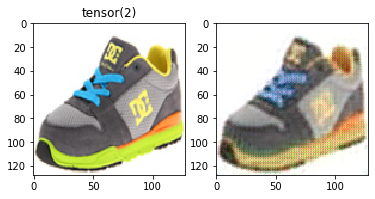

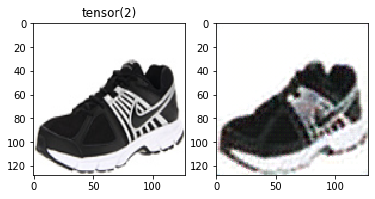

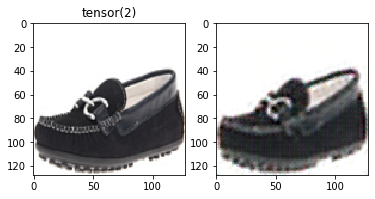

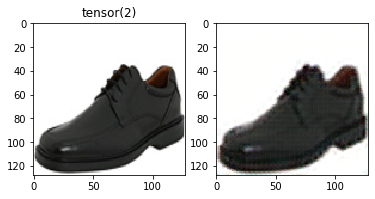

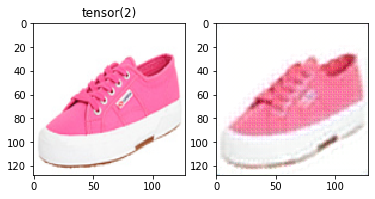

In [0]:
# training
train(myCAE, train_loader, val_loader, criterion, optimizer, nEpochs = num_epochs)

# Viewing 5 images and their reconstructions
for i, data in enumerate(train_loader):
  reconstruction = myCAE(data[0].to(device))
  reconstruction = reconstruction.to('cpu').detach()
  for j in range(5):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(data[0][j].permute(1, 2, 0))
    plt.title(data[1][j])
    plt.subplot(1, 2, 2)
    plt.imshow(reconstruction[j].permute(1, 2, 0))
  if(i == 0):
    break

**Q3c (15 pts):** Variational AutoEncoders, as covered in class, learn the probability distribution of the inputs and can be used to generate novel images.  We can further pass convolutional features into a VAE to create a convolutional VAE.  Convert your CAE from the previous question to a convolutional VAE by executing the following steps:

* In the encoder, generate two tensors of the same length, representing mean and standard deviation of the latent probability distribution. 

* Sample from a normal distribution from the learned mean and std to generate the final encoding tensor -- this is the reparametrization trick discussed in lecture.

* Decode from the encoding tensor just as in the convolutional autoencoder. 

* Change your loss function from MSE reconstruction loss to the objective function for VAE:
 * Reconstrucation Loss: binary_cross_entropy loss between original and reconstructed image. 
 * Regularization on the sampled latent normal distribution 

$$ L_{reconstruciton} = -\frac{1}{n} \sum_{i}^{n}(x_i log(f(z_i)) + (1-x_i) log(1-f(z_i))) $$
$$ L_{regularization} = \frac{1}{2n}\sum_{i}^{n}(\mu_{i}^{2} + \sigma_{i}^2 - log(\sigma_i^2)- 1)$$
$$ L_{loss} =L_{regularization} +  L_{reconstruction}$$

In your report, plot the resulting training loss curve (average training loss per epoch) and your validation loss curve (average validation loss per epoch). In your report give 5 examples of the input and corresponding reconstruction.





In [0]:
# ARCHITECTURE
class VAE(nn.Module):
    def __init__(self, encoding_dimension):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 10, 5, stride=1, padding=2),  # rbg, 10 filters, kernel is 5x5
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),
            # 10 x height/2 x height/2
            nn.Conv2d(10, 16, 5, stride=1, padding=2),  #10 filters, 16 filters,
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2)
            # 16 x height/4 x height/4
        )

        self.fcMu = nn.Linear(16384, encoding_dimension)
        self.fcLogvar = nn.Linear(16384, encoding_dimension)

        self.fcDecode = nn.Linear(encoding_dimension, 16384)


        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(16, 10, 5, stride=2, padding=1),
            # 10 x height/2 x height/2
            nn.ReLU(),
            nn.ConvTranspose2d(10, 3, 2, stride=2, padding=1),
            # 3 x height x height
        )

    def reparameterize(self, mu, logvar):
      if self.training:
        std = logvar.mul(.5).exp_()
        eps = Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)
      else:
        return mu

    def forward(self, x):
        x = self.encoder(x)
        mu, logvar = self.fcMu(x.view(-1)), self.fcLogvar(x.view(-1))
        z = self.reparameterize(mu, logvar)
        zImg = self.fcDecode(z).view(16, 32, 32)
        return self.decoder(Img), mu, logvar

# HYPERPARAMS
num_epochs = 10
criterion = nn.MSELoss()
learning_rate = 1e-3
encoding_dimension = 2000
myVAE = VAE(encoding_dimension).to(device)
optimizers = optim.Adam(myCAE.parameters())

In [0]:
# TRAIN
train(myCAE, train_loader, val_loader, criterion, optimizer, nEpochs = num_epochs)

# Viewing 5 images and their reconstructions
for i, data in enumerate(train_loader):
  reconstruction = myCAE(data[0].to(device))
  reconstruction = reconstruction.to('cpu').detach()
  for j in range(5):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(data[0][j].permute(1, 2, 0))
    plt.title(data[1][j])
    plt.subplot(1, 2, 2)
    plt.imshow(reconstruction[j].permute(1, 2, 0))
  if(i == 0):
    break

**Q3d (3 pts):** One of the many useful qualities of a VAE is that the resulting code vector has interpretable properties. To demonstrate this, choose two images from your dataset, call these images $X$ and $Y$. Compute their corresponding code vectors, call these $Z_x$ and $Z_y$ respectively. If done properly, these code vectors, when interpolated, will show an interpolation of the actual input images themselves! To linearly interpolate between $Z_x$ and $Z_y$ with interpolation factor $t$, you can use the following formula:

$$Z_{lerp} = t Z_x + (1 - t) Z_y$$

Calculate $Z_{lerp}$ with interpolation factors: $t \in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]$. For each of these interpolation factors, display the corresponding reconstruction in your writeup. Explain your results.

**Extra Credit (5 pts):** For extra credit, try linear interpolation factors with a smaller interval than 0.1 (like 0.01 for instance) and create a video from the intermediate results, showing how by interpolating between code vectors, you can smoothly get from a reconstruction of $X$ to a reconstruction of $Y$!

In [0]:
# TODO: INSERT CODE HERE

## Question 4. Generative Models: Generative Adversarial Networks (GAN's) (40 pts)

In this question you will create a Generative Adversarial Network (GAN) for the UT Zappos50K. Before you embark on this part, please read the slides thoroughly to ensure that you understand how the multiple loss functions and general structure of a GAN works. 

GANs are notoriously difficult to train, with each attempt taking a decent amount of time to run. Please start early, as underestimating how much time it takes to train a GAN led many students to not finish on time last year.



In [0]:
!pip install --upgrade grpcio
!pip install --upgrade tensorflow

     |████████████████████████████████| 2.7MB 4.9MB/s 
  Found existing installation: grpcio 1.27.1
    Uninstalling grpcio-1.27.1:
      Successfully uninstalled grpcio-1.27.1


     |████████████████████████████████| 421.8MB 35kB/s 
     |████████████████████████████████| 450kB 39.4MB/s 
     |████████████████████████████████| 3.9MB 49.9MB/s 
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0
  Found existing installation: tensorflow 1.15.0
    Uninstalling tensorflow-1.15.0:
      Successfully uninstalled tensorflow-1.15.0


In [0]:
# IMPORTS and TENSORBOARD
import torchvision
from torchvision import datasets, transforms
import torchvision.models as models
import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import FashionMNIST
from torchvision.transforms import ToTensor
import torch.nn.functional as F
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import dill
import os
from torch.utils.tensorboard import SummaryWriter
import time, datetime

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

%load_ext tensorboard
ROOT_LOG_DIR = "/content/drive/My Drive/Colab Notebooks/CIS522/HW3/logs"
TENSORBOARD_DIR = "HW3" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

cuda:0


In [0]:
# %tensorboard --logdir logs/tensorboard

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torchvision
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch
import time

In [0]:
# DATASET
batch_size = 25
inputImageHeight = 64
photo_dir = "/content/DATASETS/UTZappos50K/"

zapposDataset = torchvision.datasets.ImageFolder(
    root = photo_dir,
    transform = transforms.Compose(
        [transforms.Resize((inputImageHeight, inputImageHeight)),
        transforms.ToTensor()]))
# 70-20-10 split in order to achieve maximum training, while still leaving 5000 for testing
train_set, val_set, test_set = torch.utils.data.random_split(
    zapposDataset,
    [35025, 10000, 5000])
train_loader = DataLoader(train_set, batch_size = batch_size)
val_loader = DataLoader(val_set, batch_size = batch_size)
test_loader = DataLoader(test_set, batch_size = batch_size)

**Q4a (0 pts):** Create a normally distributed vector $z$ with $\mu = 0$, $\sigma = 1$ (i.e the np.random.normal default). The vector should have size [batch size, feature length, 1, 1]. You don't need to submit anything for this part. Here feature length describes the length of your vector $z$.


In [0]:
# TODO: INSERT CODE HERE

def z_vector(batch_size= 25, feature_length= 100):
  z= np.random.normal(0, 1, (batch_size, feature_length,1,1))
  z= z.reshape((batch_size, feature_length,1,1))
  z= torch.tensor(z).float()
  return z

z= z_vector()
print(z.shape)

torch.Size([25, 100, 1, 1])


In [0]:
for i, data in train_loader:
  print(i, data)

Streaming output truncated to the last 5000 lines.
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]]],


        [[[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]],

         [[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]],

         [[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],

**Q4b (5 pts):** Create the generator network. Use [ConvTranspose2d](https://pytorch.org/docs/stable/nn.html) to upsample the noise vector $z$ to a size of your choosing (512 is what we used but you can/should tune this). Deconvolve it until the number of channels is 3 (so it's RGB), and the output size is (64,64).  In other words, the output of the generator should be [batch size,3,64,64]. Use ReLU and batch norm after every deconvolution and use a sigmoid layer at the end to create your final output. Don't worry about the loss function for now. Describe what your final network looks like in your writeup and why you made these choices.

In [0]:
import torch.nn as nn

In [0]:
# TODO: INSERT CODE HERE
# Generator class
class Generator(nn.Module):
  def __init__(self, input_size, output_size):
    super(Generator, self).__init__()
    self.tconv1 = nn.ConvTranspose2d(input_size, 1024, 4, stride= 1, padding = 0) 
    self.bn1 = nn.BatchNorm2d(1024)

    self.tconv2 = nn.ConvTranspose2d(1024, 512, 4, stride=2, padding = 1) 
    self.bn2 = nn.BatchNorm2d(512)

    self.tconv3 = nn.ConvTranspose2d(512, 256, 4, stride = 2, padding = 1)
    self.bn3 = nn.BatchNorm2d(256)
    
    self.tconv4 = nn.ConvTranspose2d(256, 128, 4, stride = 2, padding = 1)
    self.bn4 = nn.BatchNorm2d(128)

    self.tconv5 = nn.ConvTranspose2d(128, output_size, 4, stride = 2, padding = 1)
    self.relu =  nn.LeakyReLU()
    self.tanh = nn.Tanh()


  def forward(self, x):
    # print('generator shape: ', x.shape)

    out = self.relu(self.bn1(self.tconv1(x)))
    out = self.relu(self.bn2(self.tconv2(out)))
    out = self.relu(self.bn3(self.tconv3(out)))
    out = self.relu(self.bn4(self.tconv4(out)))
    out = self.tanh(self.tconv5(out))

    # out = self.relu(self.tconv1(x))
    # # print('out 1: ', out.shape)
    # out = self.relu(self.tconv2(out))
    # # print('out 2: ', out.shape)
    # out = self.relu(self.tconv3(out))
    # # print('out 3: ', out.shape)
    # out = self.relu(self.tconv4(out))
    # # print('out 4: ', out.shape)
    # # out = self.tanh(self.tconv5(out))
    # # print('out 5: ', out.shape)
    # out = self.tanh(self.tconv6(out))
    # # print('out 6: ', out.shape)

    return (out + 1) / 2


In [0]:
g = Generator(100, 3).to(device)

In [0]:
inp = g(z.to(device))

In [0]:
inp.shape


torch.Size([25, 3, 64, 64])

**Q4c (5 pts):** Create the discriminator network. This should feel very similar to creating a CNN to classify whether an example is in the distribution or not in the distribution. Don't worry about the loss function for this part. Describe what your final network looks like in your writeup and why you made these choices.

In [0]:

# TODO: INSERT CODE HERE
#Discriminator class
class Discriminator(nn.Module):
  def __init__(self, input_size, output_size):
    super(Discriminator, self).__init__()
    self.conv1 = nn.Conv2d(input_size, 6, 4, 2, 1) #output = 64 - 4 + 2 + 2 = 64(h) * 64(w) * 6(filters)
    self.pool = nn.MaxPool2d(2) #output = 64/2 = 32(h) * 32(w) * 6(filters)
    self.conv2 = nn.Conv2d(6, 16 , 4, 2, 1) #output = 32 - 4 + 4 = 32/2 (maxpooling) = floor(32) = 16 *16 *16 -> size of input fc
    
    self.fc1 = nn.Linear(16*4*4,1024) 
    # self.fc2 = nn.Linear(4096, 1024)
    self.fc2 = nn.Linear(1024, 256)
    self.fc3 = nn.Linear(256, 16)
    self.fc4 = nn.Linear(16, output_size)

    self.dropout = nn.Dropout(0.2)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    # print('input shape: ', x.shape)
    x = self.pool(F.leaky_relu(self.conv1(x), 0.2))
    # print('conv1 ',x.shape)
    x = self.dropout(x)
    x = self.pool(F.leaky_relu(self.conv2(x), 0.2))
    # print('conv2 ',x.shape)
    x = self.dropout(x)
    x = x.view(-1, 16*4*4) # -1 here is equivalent to 64 (for the batch size) - *62*3 (62 is the output from convolution + maxpooling of size 2)
    # print('x after conv2:', x.shape)
    x = F.leaky_relu(self.fc1(x), 0.2)
    # print('x after fc1: ', x.shape)
    x = F.leaky_relu(self.fc2(x), 0.2)
    # print('x after fc2: ', x.shape)
    x = F.leaky_relu(self.fc3(x), 0.2)
    # print('x after fc3: ', x.shape)
    # x = F.leaky_relu(self.fc4(x), 0.2)
    x = self.sigmoid(self.fc4(x))  
    # print('x after fc4: ', x.shape)

    return x



In [0]:
dis = Discriminator(3, 1).to(device)
ans = dis(inp)

In [0]:
ans

tensor([[0.5035],
        [0.5029],
        [0.5029],
        [0.5026],
        [0.5036],
        [0.5035],
        [0.5032],
        [0.5013],
        [0.5008],
        [0.5039],
        [0.5005],
        [0.5016],
        [0.5051],
        [0.5054],
        [0.5032],
        [0.5053],
        [0.5046],
        [0.5043],
        [0.5031],
        [0.5030],
        [0.5034],
        [0.5031],
        [0.5044],
        [0.5029],
        [0.5018]], device='cuda:0', grad_fn=<SigmoidBackward>)

**Q4d (4 pts):** Code the loss function for the generator, it should be as follows:

$$ L_G = -\frac{1}{n}\sum_{i=1}^{n}\lg D(G(z))$$

An alternate form for convenince is:
$$ L_G = \frac{1}{n}\sum_{i=1}^{n}L_{CE}(D(G(z)), 1)$$

Where $L_{CE}$ is the cross entropy loss function and n is the batch size. Why is the ground truth label for fake data 1 here? Explain your answer in the write-up.



In [0]:
# TODO: INSERT CODE HERE

def generator_loss(d, g, z):
  #TODO: your generator loss here
  ''' Generator's loss evaluates its performance on whether not it gets caught
  1 - real image
  0 - fake image
  The generator always wants to fool the discriminator - goal of generator is to be predicted as 1 (real image)
  '''
  criterion = nn.BCELoss()
  ones = np.ones(z.shape[0])
  # print('d(g(z)) ', d(g(z)).shape)
  ones = torch.tensor(ones).float().to(device)
  # print('ones: ', ones.shape)
  loss = criterion(d(g(z)), ones) #z dimension - (64, 100, 1, 1)

  return loss


**Q4e (4 pts):** Code the loss function for the discriminator, it should be as follows:

$$ L_D = \frac{1}{2n}\sum_{i=1}^{n}L_{CE}(D(X_i), 1) + L_{CE}(D(G(z)), 0)$$

Where $L_{CE}$ is the cross entropy loss function and n is the batch size. Be sure that you're not normalizing by $n$ twice (if you feed in two vectors into BCELoss, they normalize it by the size of the vector for you).

**Important:** Remember to **detach** your generator when calculating this loss. Think about why this is the case and the repercussions of not doing so. Detail the answer to this question in your write-up.

In [0]:
# TODO: INSERT CODE HERE
#discriminator loss
def discriminator_loss(d, g, z, img):
  ''' Discriminator's loss is based on fake and real loss 
  - Goal of discriminator - being able to predict 1 if it's actual real img and 0 if it's fake img
  - Fake loss : generator's img vs. 0 (0 - fake, 1 - real)
  - Real loss : real image vs. 1
  '''
  # print('img shape: ',img.shape)
  #TODO: your discriminator loss here
  criterion = nn.BCELoss()

  #initialize the ones and zeros tensor
  ones = np.ones(z.shape[0])
  ones = torch.tensor(ones).float().to(device)
  zeros = np.zeros(z.shape[0])
  zeros = torch.tensor(zeros).float().to(device)

  # create fake img and real img
  fake_img = g(z)
  real_img = img #shape: torch.Size([64, 64 *64 *3])
  # print(real_img.shape)

  #create fake loss and real loss
  fake_loss = criterion(d(fake_img), zeros)
  real_loss = criterion(d(real_img), ones)
  loss = (fake_loss + real_loss)/2
  return loss


**Q4f (2 pts):** Create two optimizers, one for your Discriminator network and one for your generator network. Describe your choices for the learning rate and optimizer in the writeup.

In [0]:
# TODO: INSERT CODE HERE
# netD = Discriminator().to(device)
# netG = Generator().to(device)
# optimizerD = optim.Adam(netD.parameters(), lr = 0.001)
# optimizerG = optim.Adam(netG.parameters(), lr = 0.001)

**Q4g (20 pts):** Put all of these parts together to create a GAN. The training loop should look as follows:

**Training Loop:**

1.   Create your vector $z$
2.   Zero out the gradient for $G$
3.   Generate your fake image, and calculate $L_G$
4.   Backpropagate $L_G$ and have your optimizer take a step
5.   Zero out the gradient for $D$
6.   Calculate $L_D$
7.   Backpropagate $L_D$ and step your optimizer.

**Hints for training:**

1.   Make sure you're using tensorboard to keep track of the discriminator AND generator losses throughout. Note that if your discriminator loss goes to 0, this represents a failure mode of your training (look at how the generator loss function is calculated and you realize that G's gradients vanish).
2.   Keep vigilant for mode collapse. Display your image after every delta number of iterations to see that not only is your image getting better, but you're also not getting the same image each time. If so, then your network is suffering from mode collapse.
3.   Analyze your generator loss and make sure that it's roughly oscillating around a certain loss. Unlike most other tasks, your generator and discriminator loss are NOT intended to monotonically decrease. Instead they should bounce around a certain loss (see image below for example). Your graph doesn't have to look exactly like this but this is meant to illustrate how the loss should roughly bounce around a certain loss.
![Discriminator Loss](https://i.imgur.com/07JYtA1.png)
![Generator Loss Graph](https://i.imgur.com/NoMFLNg.png)

On the left is the discriminator loss graph, and as you can see, the discriminator loss as a whole goes down but not monotonically. It bounces around signifcantly at each iteration. On the right is the generator graph, whose loss actually increases. Like the discriminator loss graph, you can see that the loss varies significantly from iteration to iteration.


**Hyperparameter Tuning:**

What makes GAN's difficult to train is that they are extremely sensitive to hyperparameters. Some hyperparameters to think about when tuning your GAN:


1.   The number of times you run your discriminator vs. your generator (generally you run your discriminator more times than your generator because the discriminator is what gives your generator feedback).
2.   The learning rate for your discriminator / generator
3.   Your image output size
4.   Your feature vector size (i.e. the length of z)
5.   Your standard neural network hyperparameters (i.e. number of layers, width of layers, batch size, etc.)



There are many sources online that provide help with how to train a GAN -- feel free to look them up! Of course you may not copy code from online sources (please review the collaboration policy) but we encourage you to look up articles online to help debug your GAN. Here are a few examples that we particularly like:

1.   [Keep Calm and train a GAN](https://medium.com/@utk.is.here/keep-calm-and-train-a-gan-pitfalls-and-tips-on-training-generative-adversarial-networks-edd529764aa9)
2.   [Why is it so hard to train GAN's!](https://medium.com/@jonathan_hui/gan-why-it-is-so-hard-to-train-generative-advisory-networks-819a86b3750b)

And many more!

Be sure to start this part early as you will definitely run into issues with training that you wouldn't originally forsee!

After you finish creating your GAN, give us 5 of your best outputs (not all of your results will look reasonable) and plot your training curve for both the generator AND discriminator. Report your final hyper-parameter choices that weren't already reported above (i.e. the batch size, model parameters, etc.)



In [0]:
def generate_images(g, z):
  '''
  Displays the images in a rows * cols grid
  '''
  # imgs= g(z)
  # imgs= imgs[:rows*cols].cpu().detach().numpy()
  # print(imgs.shape)
  # #imgs= 0.5* imgs + 0.5
  # fig, ax= plt.subplots(rows, cols)
  # count= 0
  # imgs = np.reshape(imgs, (25, 64, 64))
  # imgs = np.clip(imgs, a_min = 0, a_max = 255) 

  # for row in range(rows):
  #   for col in range(cols):
  #     img= imgs[count]
  #     ax[row, col].imshow(img)
  #     ax[row, col].axis('off')
  #     count += 1
  # fig.suptitle(name)
  # fig.savefig("%s.png"%(name))
  # if(show): 
  #   plt.show()
  # else: 
  #   plt.close()

  figure = plt.figure()
  for i, data in enumerate(train_loader):

    reconstruction = g(z)
    reconstruction = reconstruction.to('cpu').detach()
    for j in range(5):
      plt.subplot(2, 5, j + 1)
      plt.imshow(data[0][j].permute(1, 2, 0))
      plt.title(data[1][j])
      plt.subplot(2, 5, j + 6)
      plt.imshow(reconstruction[j].permute(1, 2, 0))
    if(i == 0):
      break
  figure.tight_layout()


# generator = Generator(100,3).to(device)
# generate_images(generator, z, 5, 5)

In [0]:
# TODO: INSERT CODE HERE
%matplotlib inline
epochs = 100
step = 0

discriminator = Discriminator(3, 1).to(device) #similar to CNN - input: 64 * 64 * 3 img, output: prediction of fake or real
generator = Generator(100, 3).to(device) # used Sequential() - 100: latent z's channel, 3: img's channels
d_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0003)
g_optimizer = optim.Adam(generator.parameters(), lr = 0.0001)
latent_vec = z_vector().to(device) 

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[0/100 : 200] G Loss: 0.7989	 D Loss: 0.6396	
[0/100 : 400] G Loss: 0.6679	 D Loss: 0.6831	
[0/100 : 600] G Loss: 0.7340	 D Loss: 0.6916	
[0/100 : 800] G Loss: 0.8304	 D Loss: 0.6541	
[0/100 : 1000] G Loss: 0.7858	 D Loss: 0.6312	
[0/100 : 1200] G Loss: 0.8226	 D Loss: 0.5848	
[0/100 : 1400] G Loss: 0.8345	 D Loss: 0.6377	
[1/100 : 1600] G Loss: 0.6685	 D Loss: 0.6996	
[1/100 : 1800] G Loss: 0.7143	 D Loss: 0.6949	
[1/100 : 2000] G Loss: 0.9146	 D Loss: 0.6869	
[1/100 : 2200] G Loss: 0.6328	 D Loss: 0.6812	
[1/100 : 2400] G Loss: 2.0291	 D Loss: 0.2585	
[1/100 : 2600] G Loss: 1.5543	 D Loss: 0.3403	
[1/100 : 2800] G Loss: 0.8467	 D Loss: 0.5786	
[2/100 : 3000] G Loss: 0.8538	 D Loss: 0.5467	
[2/100 : 3200] G Loss: 0.8256	 D Loss: 0.6228	
[2/100 : 3400] G Loss: 0.7978	 D Loss: 0.7221	
[2/100 : 3600] G Loss: 0.8272	 D Loss: 0.6164	
[2/100 : 3800] G Loss: 0.7899	 D Loss: 0.6244	
[2/100 : 4000] G Loss: 0.8959	 D Loss: 0.5044	
[2/100 : 4200] G Loss: 1.0485	 D Loss: 0.6638	
[3/100 : 4400] G 

KeyboardInterrupt: ignored

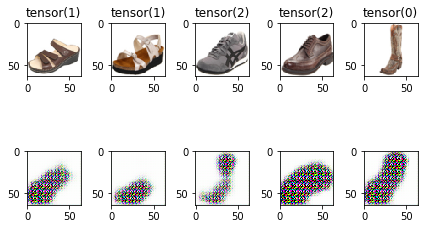

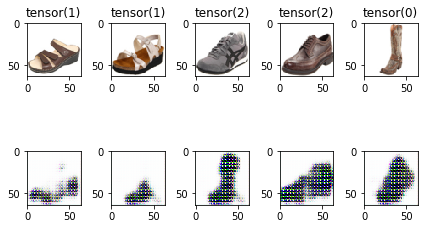

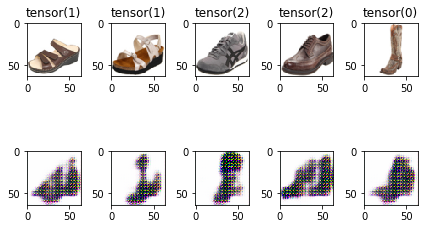

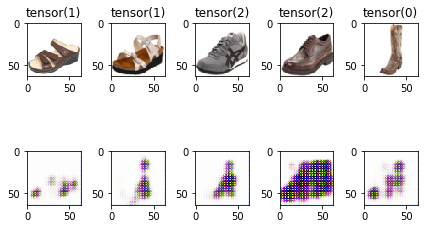

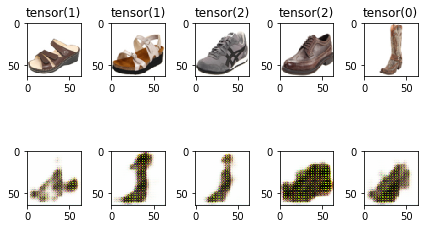

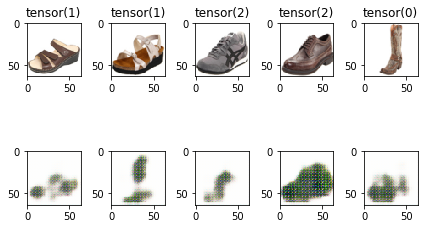

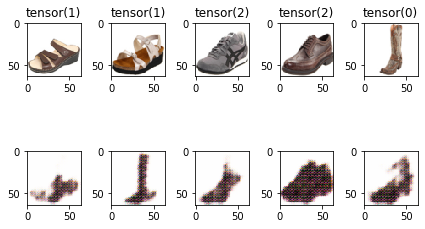

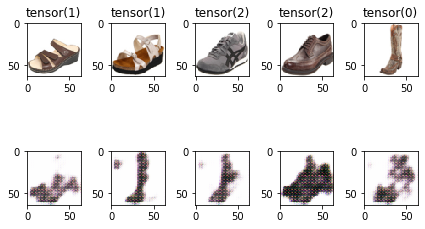

Error in callback <function flush_figures at 0x7f99316d69d8> (for post_execute):


KeyboardInterrupt: ignored

In [0]:
# generator = Generator(100, 784).to(device)
# discriminator = Discriminator(784, 1).to(device)
# g_optimizer= optim.Adam(generator.parameters(), lr= 0.0002)
# d_optimizer= optim.Adam(discriminator.parameters(), lr= 0.0001)
# latent_vec = z_vector() 

for epoch in range(epochs): 
  for i, (X, y) in enumerate(train_loader):
    step= step + 1
    
    #orginal image:  (64,3,128,128)
    # real_images = X.view((X.shape[0], -1)) #shape: torch.Size([64, 64 *64 *3])
    real_images = X.to(device)
    
    z = z_vector().to(device)

    #zero out the generator gradient
    generator.zero_grad()
    #generate image and calculate generator loss
    g_loss= generator_loss(discriminator, generator, z)
    #backpropagate
    g_loss.backward()
    #take a step
    g_optimizer.step()

    #zero out the discriminator
    discriminator.zero_grad()
    #calculate discriminator loss
    d_loss = discriminator_loss(discriminator, generator, z, real_images)
    # d_loss, d_real, d_fake = discriminator_loss(discriminator, generator, z, real_images)
    #backpropagate
    d_loss.backward()
    #take a step
    d_optimizer.step()

    if step % 200 == 0: 
      print("[%d/%d : %d] G Loss: %.4f\t D Loss: %.4f\t"
           %(epoch, epochs, step, g_loss, d_loss))
      logger.add_scalar("G Loss", g_loss, step)
      logger.add_scalar("D Loss", d_loss, step)
      # logger.add_scalar("D Loss/real",d_real, step)
      # logger.add_scalar("D Loss/fake", d_fake, step)

    if step % 2000 == 0:
      generate_images(generator, latent_vec)
      # torch.save(generator.state_dict(), "models/generator-%d.pt"%(int(time.time())))
      # torch.save(discriminator.state_dict(), "models/discriminator-%d.pt"%(int(time.time())))
      # print("MODEL ID %d.pt"%(int(time.time())))

In [0]:
# torch.save(generator.state_dict(), "generator2.pt")

In [0]:
# torch.save(discriminator.state_dict(), "discriminator2.pt")

In [0]:
%tensorboard --logdir {ROOT_LOG_DIR.replace(" ", "\\ ")}

<IPython.core.display.Javascript object>

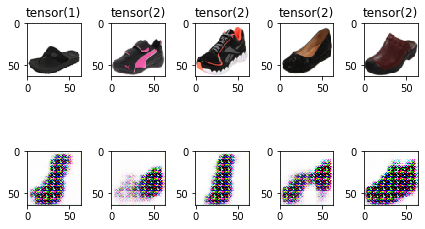

In [0]:
figure = plt.figure()
for i, data in enumerate(train_loader):

  reconstruction = generator(z)
  reconstruction = reconstruction.to('cpu').detach()
  for j in range(5):
    plt.subplot(2, 5, j + 1)
    plt.imshow(data[0][j].permute(1, 2, 0))
    plt.title(data[1][j])
    plt.subplot(2, 5, j + 6)
    plt.imshow(reconstruction[j].permute(1, 2, 0))
  if(i == 0):
    break
figure.tight_layout()

In [0]:
%load_ext tensorboard

## Question 5. Least Square GAN (Extra Credit)
The main idea of LSGAN is to use loss function that provides smooth and non-saturating gradient in discriminator 
D


**Q5a (10):** Implement the above GAN model with the follwing objective:
$$\begin{aligned}
&\min _{D} V_{\mathrm{LSGAN}}(D)=\frac{1}{2} \mathbb{E}_{\boldsymbol{x} \sim p_{\mathrm{dnta}}(\boldsymbol{x})}\left[(D(\boldsymbol{x})-1)^{2}\right]+\frac{1}{2} \mathbb{E}_{\boldsymbol{z} \sim p_{\boldsymbol{z}}(\boldsymbol{z})}\left[(D(G(\boldsymbol{z})))^{2}\right]\\
&\min _{G} V_{\mathrm{LSGAN}}(G)=\frac{1}{2} \mathbb{E}_{\boldsymbol{z} \sim p_{\boldsymbol{z}}(\boldsymbol{z})}\left[(D(G(\boldsymbol{z}))-1)^{2}\right]
\end{aligned}$$




**Q5b (5):**Plot the outputs for 10 intermediate stages of training and visulaize the generated outputs for those intermediate stages.

**Q5c (5):**Generate 10 samples using the trained model

## Submission Instructions

The deadline for all parts of this assignment is **March 5, 2020 at 11:59pm**.

There are two submissions on Gradescope:
*   HW3 - Computer Vision (Writeup)
*   HW3 - Computer Vision (Programming)

For *HW3 - Computer Vision (Writeup)* submit your written responses to the questions above as the file **"522_HW3_writeup.pdf"**

For *HW3 - Computer Vision (Programming)* submit the following files as your submission:
1.   522_HW3_submission.dill
2.   This notebook, named as 522_HW3_notebook.ipynb

**Leaderboard:** When you submit, you can choose to add yourself as part of the leaderboard! Extra credit may be awarded to those that perform particularly well on the leaderboard.

**Gradescope Score:** After you submit, you'll see that all of the classifier questions are out of zero points. To encourage as much hypertuning, we will not be releasing the accuracy cutoffs until after the late deadline has passed.

In [0]:
import dill
import os

file_to_obj_map = {
    'test_case_1b' : test_case_1b,
    'test_case_1c' : test_case_1c,
    'test_case_1d' : test_case_1d,
    'test_case_2a' : test_case_2a,
}

tests_path = "522_HW3_submission.dill"
with open(tests_path, 'wb') as pickle_file:
  dill.dump(file_to_obj_map, pickle_file)